## Optical Flow

* https://paper.dropbox.com/doc/Optical-Flow-H8L4QOoNAIjqXzFdaskOU

In [1]:
%matplotlib inline
%load_ext autoreload
%autoreload 2
import os
import sys
p = os.path.join(os.path.dirname('__file__'), '..')
sys.path.append(p)
from common import *

In [3]:
DATA_DIR = '../data/'
json_fpath = os.path.join(DATA_DIR, 'volleyball_frame_00665.json')
img_fpath = os.path.join(DATA_DIR, 'volleyball_frame_00665.png')
IMG_DIR = os.path.join(DATA_DIR, 'volleyball', 'images_subset')
metadata_fpath = os.path.join(DATA_DIR, 'volleyball_bbox_labels.csv')
FIGSIZE=(16,16)
COLORS = {
    'red': (255,0,0),
    'green': (0,255,0),
    'blue': (0,0,255),
    'white': (255,255,255),
    'black': (0,0,0),
}
metadata = pd.read_csv(metadata_fpath)
fnames = metadata['filename']
fpaths = [os.path.join(IMG_DIR, f) for f in fnames]
metadata['fpath'] = fpaths

In [5]:
def plot_img(arr, fs=FIGSIZE, cmap='gray', title=None):
    plt.figure(figsize=fs)
    plt.imshow(arr.astype('uint8'), cmap=cmap)
    plt.title(title)
    plt.show()
    
def load_cv2_img(fpath, w=None, h=None, colorspace=cv2.COLOR_BGR2RGB):
    img = cv2.imread(fpath)
    if colorspace is not None:
        img = cv2.cvtColor(img, colorspace)
    if None not in [w,h]:
        img = cv2.resize(img, (w, h), interpolation=cv2.INTER_CUBIC)
    return img

## Sparse Flow (Lucas Kanade)

* https://docs.opencv.org/3.3.1/d7/d8b/tutorial_py_lucas_kanade.html

In [24]:
tracked_flow = []
tracked_frames = []
limit = 1000

# params for ShiTomasi corner detection
feature_params = dict( maxCorners = 200,
                       qualityLevel = 0.3,
                       minDistance = 7,
                       blockSize = 7 )

# Parameters for lucas kanade optical flow
lk_params = dict( winSize  = (15,15),
                  maxLevel = 2,
                  criteria = (cv2.TERM_CRITERIA_EPS | cv2.TERM_CRITERIA_COUNT, 10, 0.03))

# Create some random colors
color = np.random.randint(0,255,(100,3))

prior_frame = load_cv2_img(metadata['fpath'][0])
prior_gray = cv2.cvtColor(prior_frame, cv2.COLOR_BGR2GRAY)
p0 = cv2.goodFeaturesToTrack(prior_gray, mask = None, **feature_params)

# Create a mask image for drawing purposes
mask = np.zeros_like(prior_frame)

for fpath in metadata['fpath'][1:limit]:
    cur_frame = load_cv2_img(fpath)
    cur_gray = cv2.cvtColor(cur_frame, cv2.COLOR_BGR2GRAY)
    
    # calculate optical flow
    p1, st, err = cv2.calcOpticalFlowPyrLK(prior_gray, cur_gray, p0, None, **lk_params)
    
    # Select good points
    good_new = p1[st==1]
    good_old = p0[st==1]
    
    # draw the tracks
    for i, (new, old) in enumerate(zip(good_new, good_old)):
        a,b = new.ravel()
        c,d = old.ravel()
        mask = cv2.line(mask, (a,b), (c,d), color[i].tolist(), 2)
        frame = cv2.circle(cur_frame, (a,b), 5, color[i].tolist(), -1)
    
    img = cv2.add(cur_frame, mask)
    tracked_frames.append(img)
    old_gray = cur_gray.copy()
    p0 = good_new.reshape(-1, 1, 2)

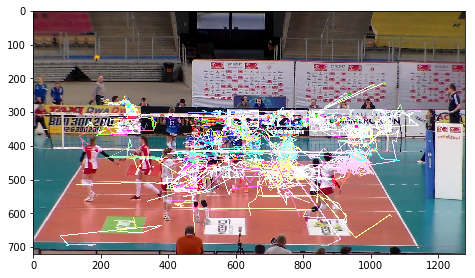

In [25]:
fig = plt.figure()
axes = plt.axes([0, 0.03, 1, 0.97])
frame = tracked_frames[0]
imgplot = axes.imshow(frame, animated=True)
def init():
    return (imgplot,)

def animate(img):
    imgplot.set_array(img)
    return (imgplot,)

anim = animation.FuncAnimation(fig, animate, init_func=init,
                               frames=tracked_frames, interval=100, blit=True)

HTML(anim.to_html5_video())

## Dense Flow (Farneback)

* https://docs.opencv.org/3.3.1/d7/d8b/tutorial_py_lucas_kanade.html

In [33]:
flow_fields = []
tracked_frames = []
prior_frame = load_cv2_img(metadata['fpath'][0])
prior_gray = cv2.cvtColor(prior_frame, cv2.COLOR_BGR2GRAY)
hsv = np.zeros_like(prior_frame)
hsv[...,1] = 255

for fpath in metadata['fpath'][1:limit]:
    cur_frame = load_cv2_img(fpath)
    cur_gray = cv2.cvtColor(cur_frame, cv2.COLOR_BGR2GRAY)
    
    flow = cv2.calcOpticalFlowFarneback(
        prior_gray, cur_gray, None, 0.5, 3, 
        15, 3, 5, 1.2, 0)
    flow_fields.append(flow)
    mag, ang = cv2.cartToPolar(flow[...,0], flow[...,1])
    hsv[...,0] = ang*180/np.pi/2
    hsv[...,2] = cv2.normalize(mag, None, 0, 255, cv2.NORM_MINMAX)
    bgr = cv2.cvtColor(hsv, cv2.COLOR_HSV2BGR)
    tracked_frames.append(bgr)
    prior_frame = cur_frame

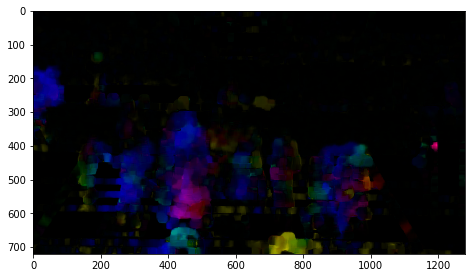

In [34]:
fig = plt.figure()
axes = plt.axes([0, 0.03, 1, 0.97])
frame = tracked_frames[0]
imgplot = axes.imshow(frame, animated=True)
def init():
    return (imgplot,)

def animate(img):
    imgplot.set_array(img)
    return (imgplot,)

anim = animation.FuncAnimation(fig, animate, init_func=init,
                               frames=tracked_frames, interval=100, blit=True)

HTML(anim.to_html5_video())

## Shot Boundary Detection

In [28]:
"""
At video time 0:49 (10 FPS = 500th frame?) and 1:24 the camera cuts to a new shot. Can we identify this with optical flow?

Steps:
1) Calculate median optical flow vector magnitude across frames
2) Plot the median optical flow vector magnitude for each frame
3) Inspect the spikes/outliers
""";

In [35]:
flow_fields = np.asarray(flow_fields)
flow_fields[0].shape

In [43]:
mean_flow = np.mean(flow_fields)
median_flow = np.median(flow_fields)
mean_flow,median_flow

In [51]:
reshaped_flow_fields = flow_fields.reshape((len(flow_fields), (720*1280), 2))
median_flow_imgs = np.median(reshaped_flow_fields, axis=1)
mean_flow_imgs = np.mean(reshaped_flow_fields, axis=1)
median_flow_imgs.shape

(999, 2)

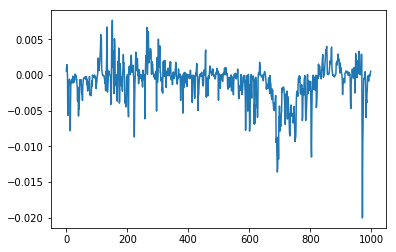

In [57]:
plt.plot(median_flow_imgs[:,0])

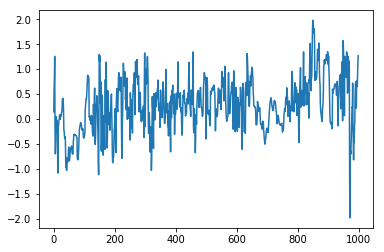

In [58]:
plt.plot(mean_flow_imgs[:,0])

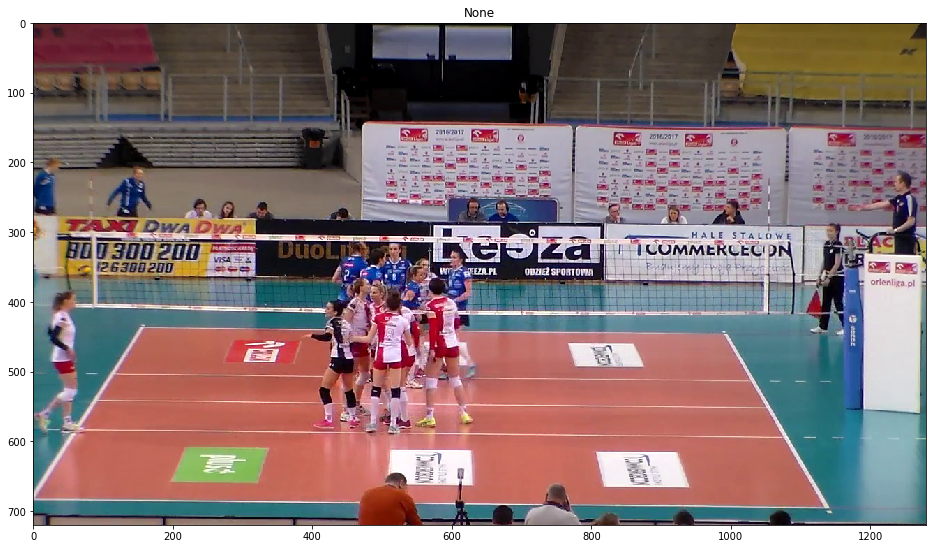

In [68]:
# Shot boundary at frame 500
# Haha this isn't working. Need a better way...
img = load_cv2_img(metadata['fpath'][500])
plot_img(img)
mean_flow_imgs[500,:], mean_flow_imgs[499,:], mean_flow_imgs[501,:]

## Links

Theory

- https://en.wikipedia.org/wiki/Optical_flow
- https://classes.soe.ucsc.edu/cmpe264/Fall06/Lec14.pdf
- https://web.eecs.umich.edu/~jjcorso/t/598F14/files/lecture_1015_motion.pdf
- https://web.eecs.umich.edu/~jjcorso/t/598F14/files/

Papers

- FlowNet: Learning Optical Flow with Convolutional Networks (https://arxiv.org/pdf/1504.06852.pdf)
- https://github.com/abhineet123/Deep-Learning-for-Tracking-and-Detection
- Optical flow for camera stabilization
- Optical Flow Overview
- Vehicle Velocity Estimation
- Pyramid Methods in Image Processing

Code

- https://gist.github.com/nicolov/d010233ea8d35887c6ab47cca97d396f
- https://docs.opencv.org/3.3.1/d7/d8b/tutorial_py_lucas_kanade.html
- Lukas–Kanade tracker
- https://nicolovaligi.com/car-speed-estimation-windshield-camera.html
- https://github.com/tikroeger/OF_DIS
- https://github.com/lmb-freiburg/flownet2